![header](figures/logos.jpg)

# Copernicus Marine Sea Level Demo

<div style="text-align: right"><i> 2022-08-03 SEALEVEL_DEMO </i></div>

***
**Authors:**  M. Ballarotta <br>
**Copyright:** 2022 M. Ballarotta <br>
**License:** MIT


<div class="alert alert-block alert-success">
<h1><center>How to detect eddies in Copernicus Sea Level products ?</center></h1></div>

***
**General Note 1**: Execute each cell through the <button class="btn btn-default btn-xs"><i class="icon-play fa fa-play"></i></button> button from the top MENU (or keyboard shortcut `Shift` + `Enter`).<br>
<br>
**General Note 2**: If, for any reason, the kernel is not working anymore, in the top MENU, click on the <button class="btn btn-default btn-xs"><i class="fa fa-repeat icon-repeat"></i></button> button. Then, in the top MENU, click on "Cell" and select "Run All Above Selected Cell".<br>
***


<div class="alert alert-danger" role="alert">

<h3>Learning outcomes</h3>

At the end of this notebook you will know:
<ul>
  <li>How you can to access Copernicus Marine Products.</li>
  <li>How you can run eddy identitication for specific date.</li>
  <li>How to visualise and analyse your detection with other proxy data such as Sea Surface Temperature or Ocean Colour.</li>
</ul>
    
</div>



## 0. Environment Setup

At first, let's setup the notebook with all the necessary tools available from the Jupyter Notebook Ecosystem.

#### Importing modules
* Unlike MATLAB, Python libraries need to be `imported` before they can be used
* Imported libraries often have a short name ("namespace")  (not mandatory, though; you'll most often find xarray shortened as xr and numpy as np. For lisibility we choose not to, except for matplotlib.pyplot and cartopy.crs, a bit long)
* Portions of libraries can be imported

In [1]:
import numpy as np
import xarray as xr
import getpass

import warnings
%matplotlib inline
warnings.simplefilter("ignore")

import sys
sys.path.append('..')
from src.mod_io import *
from src.mod_plot import *
from src.mod_eddy import *

Bad value in file '/home/mballarotta/.config/matplotlib/matplotlibrc', line 38 ('backend      : qt4agg'): Key backend: 'qt4agg' is not a valid value for backend; supported values are ['GTK3Agg', 'GTK3Cairo', 'GTK4Agg', 'GTK4Cairo', 'MacOSX', 'nbAgg', 'QtAgg', 'QtCairo', 'Qt5Agg', 'Qt5Cairo', 'TkAgg', 'TkCairo', 'WebAgg', 'WX', 'WXAgg', 'WXCairo', 'agg', 'cairo', 'pdf', 'pgf', 'ps', 'svg', 'template']


<hr>

### Create an account on Copernicus Marine Service: https://resources.marine.copernicus.eu/registration-form

### Login

In [2]:
USERNAME = 'mballarotta1'
PASSWORD = getpass.getpass('Enter your password: ')

Enter your password:  ··········


<div class="alert alert-info" role="alert">

<h2>1. Copernicus Products</h2>

</div>

We will focus on the following product (available on the [Copernicus Catalogue](http://marine.copernicus.eu/services-portfolio/access-to-products/?option=com_csw&task=results)):

| Product Description | PRODUCT IDENTIFIER | DOI | 
|:--------------------:|:-----------------------:|:-------------:|
| GLOBAL OCEAN GRIDDED L4 SEA SURFACE HEIGHTS AND DERIVED VARIABLES REPROCESSED (1993-ONGOING) | SEALEVEL_GLO_PHY_L4_MY_008_047 | [https://doi.org/10.48670/moi-00148](https://doi.org/10.48670/moi-00148) | 
| Global Ocean Physics Reanalysis | GLOBAL_MULTIYEAR_PHY_001_030 | [https://doi.org/10.48670/moi-00021](https://doi.org/10.48670/moi-00021) | 
| Global Ocean OSTIA Sea Surface Temperature and Sea Ice Reprocessed | SST_GLO_SST_L4_REP_OBSERVATIONS_010_011 | [https://doi.org/10.48670/moi-00168](https://doi.org/10.48670/moi-00168) | 
| Global Ocean Colour (Copernicus-GlobColour), Bio-Geo-Chemical, L4 (monthly &amp; interpolated) from Satellite Observations (1997-ongoing) | OCEANCOLOUR_GLO_BGC_L4_MY_009_104 | [https://doi.org/10.48670/moi-00281](https://doi.org/10.48670/moi-00281) | 

In [3]:
DUACS_L4_DT_DATASET_ID = 'cmems_obs-sl_glo_phy-ssh_my_allsat-l4-duacs-0.25deg_P1D'
GLORYS12v1_DATASET_ID = 'cmems_mod_glo_phy_my_0.083_P1D-m'
OSTIA_DT_DATASET_ID = 'METOFFICE-GLO-SST-L4-REP-OBS-SST'
CHLORO_DATASET_ID = 'cmems_obs-oc_glo_bgc-plankton_my_l4-gapfree-multi-4km_P1D'

In [4]:
date_of_interest = '2019-01-01'

### 1.1 Read GLORYS12v1 Reanalysis Product

In [5]:
data_store_glorys12v1 = copernicusmarine_datastore(GLORYS12v1_DATASET_ID, USERNAME, PASSWORD)

In [6]:
ds_glorys12v1 = xr.open_dataset(data_store_glorys12v1)
ds_glorys12v1 = ds_glorys12v1.rename({'zos': 'adt'})

### 1.2 Read OSTIA SST Product

In [7]:
data_store_ostia = copernicusmarine_datastore(OSTIA_DT_DATASET_ID, USERNAME, PASSWORD)

In [8]:
ds_ostia = xr.open_dataset(data_store_ostia)

### 1.3 Read Chlorophyll Product

In [9]:
data_store_chlorophyll = copernicusmarine_datastore(CHLORO_DATASET_ID, USERNAME, PASSWORD)

In [10]:
ds_chlorophyll = xr.open_dataset(data_store_chlorophyll)

### 1.4 Read DUACS-DT2021 Product

In [11]:
data_store_duacs_dt2021 = copernicusmarine_datastore(DUACS_L4_DT_DATASET_ID, USERNAME, PASSWORD)

In [12]:
ds_duacs_dt2021 = xr.open_dataset(data_store_duacs_dt2021)

### 1.5 Select date of interest

In [13]:
ds_glorys12v1_selection = ds_glorys12v1['adt'].sel(time=date_of_interest)
ds_glorys12v1_selection = ds_glorys12v1_selection.to_dataset()

In [14]:
ds_duacs_dt2021_selection = ds_duacs_dt2021['adt'].sel(time=date_of_interest)
ds_duacs_dt2021_selection = ds_duacs_dt2021_selection.to_dataset()

In [15]:
ds_ostia_selection = ds_ostia.sel(time=date_of_interest)
ds_ostia_selection['lon']= ds_ostia_selection['lon']%360.
ds_ostia_selection = ds_ostia_selection.sortby('lon')

In [16]:
ds_chloro_selection = ds_chlorophyll.sel(time=date_of_interest)
ds_chloro_selection['lon'] = ds_chloro_selection['lon']%360.
ds_chloro_selection = ds_chloro_selection.sortby('lon')

<div class="alert alert-info" role="alert">

<h2>2. Run eddies detection on Copernicus Sea Level Products</h2>
    
</div>

### 2.1 Eddy detection GLORYS12v1

In [17]:
regular_grid_glorys12, anticyclone_glorys12, cyclone_glorys12 = eddy_detection(ds_glorys12v1_selection, pixel_limit=(15, 6000))

We assume pixel position of grid is centered for /home/mballarotta/Copernicus_Marine/demo_cmems_diags/notebooks/tmp9p225fc_.nc
No filtering above 85.000000 degrees of latitude


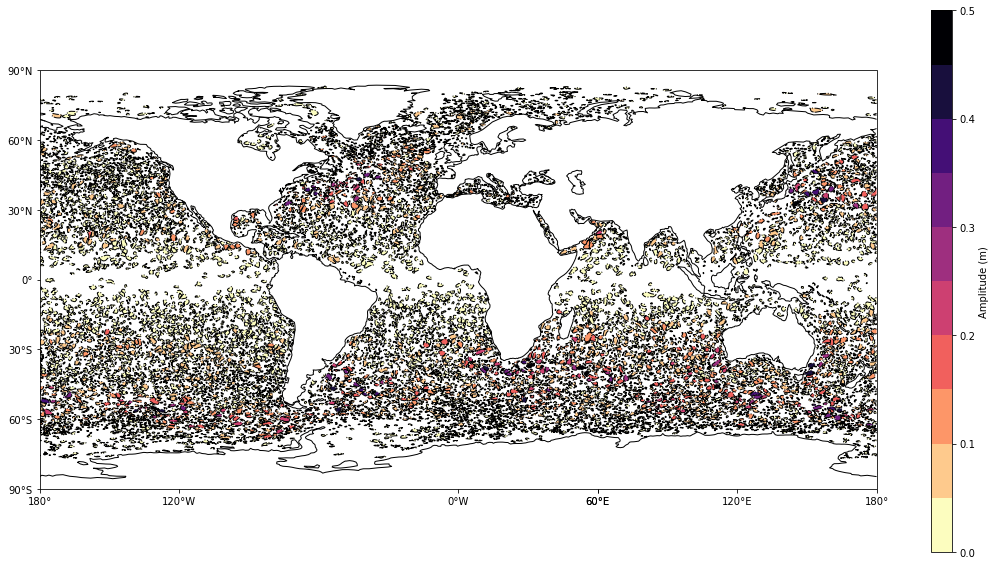

In [18]:
display_identification(anticyclone_glorys12, cyclone_glorys12, lon_min=0, lon_max=360, lat_min=-80, lat_max=90)

### 2.2 Eddy detection DUACS-DT2021

In [19]:
regular_grid_duacs_dt2021, anticyclone_duacs_dt2021, cyclone_duacs_dt2021 = eddy_detection(ds_duacs_dt2021_selection, pixel_limit=(5, 2000))

We assume pixel position of grid is centered for /home/mballarotta/Copernicus_Marine/demo_cmems_diags/notebooks/tmpanyr1yic.nc
No filtering above 85.000000 degrees of latitude


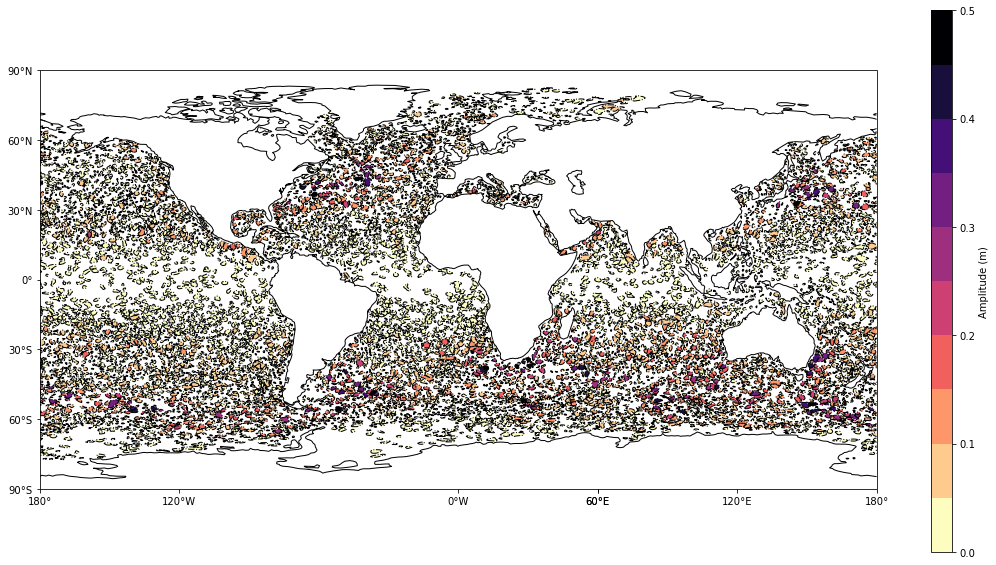

In [20]:
display_identification(anticyclone_duacs_dt2021, cyclone_duacs_dt2021, lon_min=0, lon_max=360, lat_min=-80, lat_max=90)

<div class="alert alert-info" role="alert">

<h2>3. Compare eddies detection on Copernicus Sea Level Products</h2>
    
</div>

### 3.1 Eddies contours superimposed on Sea Surface Temperature and Chlorophyl Products

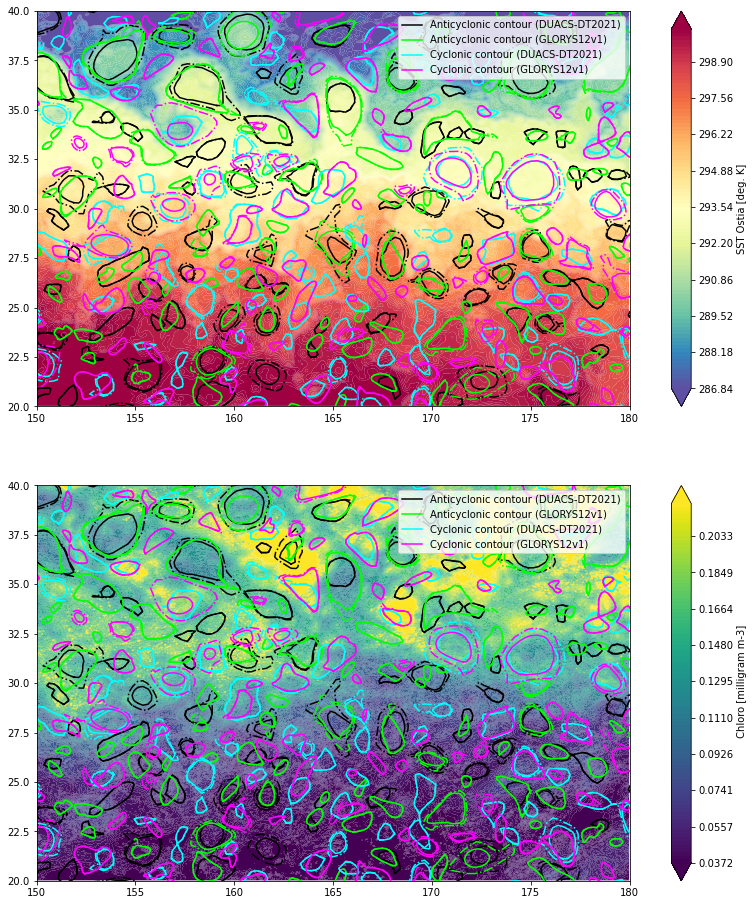

In [21]:
compare_identification(anticyclone_duacs_dt2021, cyclone_duacs_dt2021, 'DUACS-DT2021', 
                       anticyclone_glorys12, cyclone_glorys12, 'GLORYS12v1', 
                       lon_min=150, lon_max=180, lat_min=20, lat_max=40, ds_sst=ds_ostia_selection, ds_chloro=ds_chloro_selection)

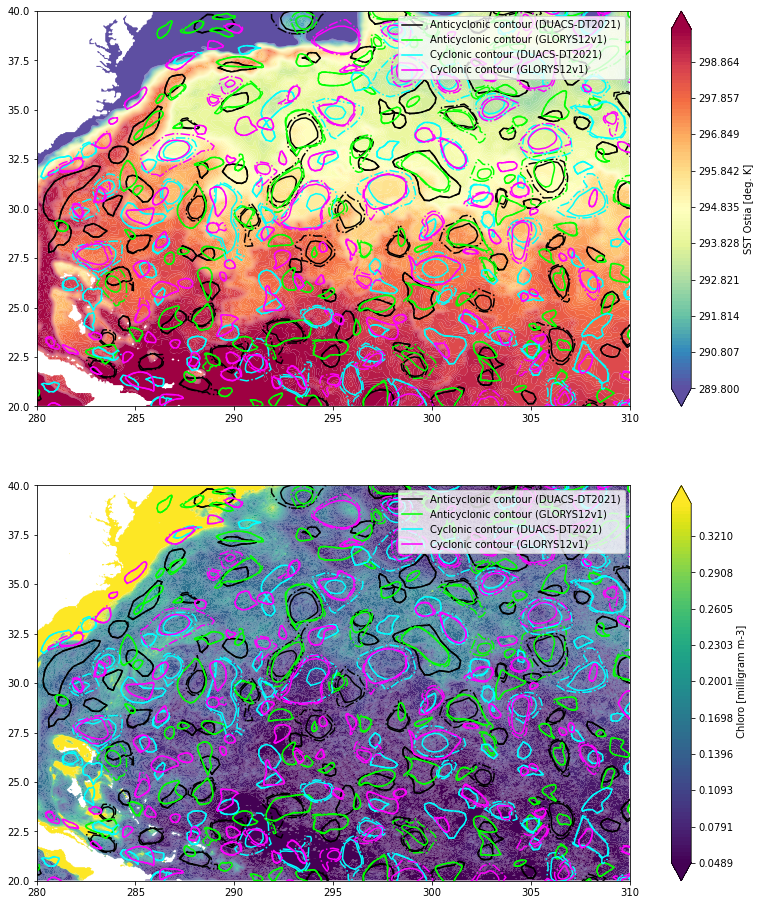

In [22]:
compare_identification(anticyclone_duacs_dt2021, cyclone_duacs_dt2021, 'DUACS-DT2021', 
                       anticyclone_glorys12, cyclone_glorys12, 'GLORYS12v1', 
                       lon_min=280, lon_max=310, lat_min=20, lat_max=40, ds_sst=ds_ostia_selection, ds_chloro=ds_chloro_selection)

### 3.2 Statistical distribution of eddies properties

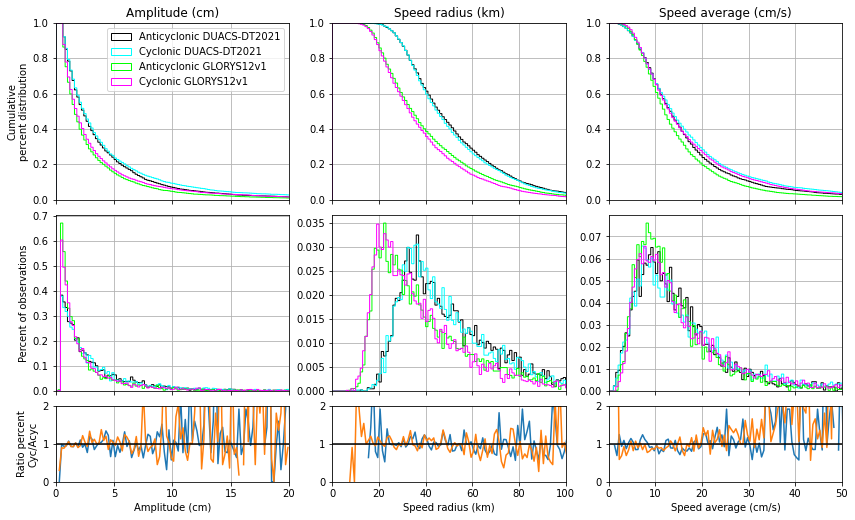

In [23]:
compare_identification_stats(anticyclone_duacs_dt2021, cyclone_duacs_dt2021, 'DUACS-DT2021', 
                       anticyclone_glorys12, cyclone_glorys12, 'GLORYS12v1')